# LEVEL 2 
# Task 1 : Restaurent Ratings
# (A) - Analyze the distribution of aggregate ratings and determine the most common rating range.

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [8]:
from plotly.offline import iplot
import plotly as py
import plotly.tools as tls
import cufflinks as cf
py.offline.init_notebook_mode(connected=True) #Turning on notebook mode 
cf.go_offline()

In [10]:
df=pd.read_csv('C:\\Users\\piyus\\Downloads\\Dataset .csv')

In [11]:
analyze_distribution_of_aggregate_rating = df['Aggregate rating'].value_counts().sort_index()
most_common_rating_range = analyze_distribution_of_aggregate_rating.idxmax()
print("the most common rating range is ",most_common_rating_range)

the most common rating range is  0.0


# (B) - Calculate the average number of votes received by restaurants.

In [12]:
average_number_of_votes= df['Votes'].mean()
print("the average number of votes recieved by resturants is :",average_number_of_votes)

the average number of votes recieved by resturants is : 156.909747670401


# LEVEL 2 
# Task 2 :Cuisine Combination
# (A)- Identify the most common combinations of cuisines in the dataset.

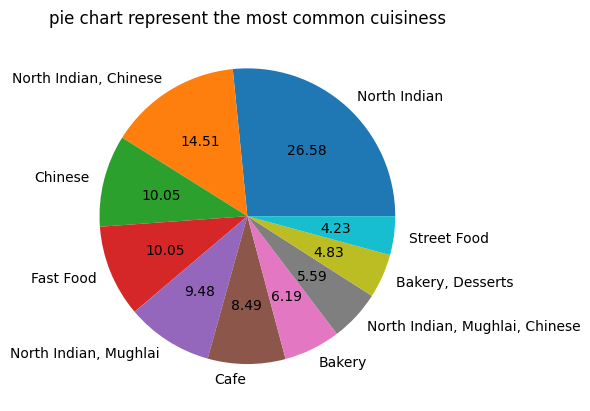

In [13]:
most_common_combination_of_cuisines= df['Cuisines'].value_counts().head(10)

plt.pie(most_common_combination_of_cuisines,labels= most_common_combination_of_cuisines.index,autopct="%.2f")

plt.title("pie chart represent the most common cuisiness")

plt.show()

# (B) - Determine if certain cuisine combinations tend to have higher ratings.

In [14]:
cuisine_combination_avg_rate = df.groupby('Cuisines')['Aggregate rating'].mean()
avg_rate_of_top10_cuisines= cuisine_combination_avg_rate.nlargest(10)
print("average rating for the top 10 cuisines")
print(avg_rate_of_top10_cuisines)

average rating for the top 10 cuisines
Cuisines
American, BBQ, Sandwich         4.9
American, Burger, Grill         4.9
American, Caribbean, Seafood    4.9
American, Coffee and Tea        4.9
American, Sandwich, Tea         4.9
BBQ, Breakfast, Southern        4.9
Burger, Bar Food, Steak         4.9
Continental, Indian             4.9
European, Asian, Indian         4.9
European, Contemporary          4.9
Name: Aggregate rating, dtype: float64


# LEVEL 2
# Task 3 : Geographic Analysis
# (A) - Plot the locations of restaurants on a map using longitude and latitude coordinates.
# (B) - Identify any patterns or clusters of restaurants in specific areas.

In [33]:
pip install folium


Note: you may need to restart the kernel to use updated packages.


In [36]:
pip install scikit-learn

                                              0.0/9.3 MB ? eta -:--:--
                                              0.0/9.3 MB ? eta -:--:--
                                              0.0/9.3 MB ? eta -:--:--
                                              0.0/9.3 MB 217.9 kB/s eta 0:00:43
                                              0.1/9.3 MB 654.9 kB/s eta 0:00:14
     -                                        0.2/9.3 MB 1.0 MB/s eta 0:00:09
     -                                        0.4/9.3 MB 1.3 MB/s eta 0:00:07
     --                                       0.5/9.3 MB 1.6 MB/s eta 0:00:06
     --                                       0.6/9.3 MB 1.6 MB/s eta 0:00:06
     --                                       0.7/9.3 MB 1.7 MB/s eta 0:00:06
     ---                                      0.8/9.3 MB 1.7 MB/s eta 0:00:06
     ----                                     1.0/9.3 MB 1.9 MB/s eta 0:00:05
     ----                                     1.1/9.3 MB 2.0 MB/s eta 0:00:05
   

In [37]:
import pandas as pd
import folium
from IPython.display import display
from sklearn.cluster import KMeans

In [38]:
df=pd.read_csv('C:\\Users\\piyus\\Downloads\\Dataset .csv')

In [40]:
restaurant_names = df["Restaurant Name"]
latitude = df["Latitude"]
longitude = df["Longitude"]

In [41]:
X = df[["Latitude", "Longitude"]]
num_clusters = 5

In [43]:
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
df["Cluster"] = kmeans.fit_predict(X)

C:\Users\piyus\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [44]:
map_center = [latitude.mean(), longitude.mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

In [45]:
cluster_colors = ['red', 'blue', 'green', 'purple', 'orange']

In [46]:
for index, row in df.iterrows():
    restaurant_name = row["Restaurant Name"]
    latitude = row["Latitude"]
    longitude = row["Longitude"]
    cuisines = row["Cuisines"]
    rating = row["Aggregate rating"]
    cluster = row["Cluster"]

    popup_text = f"Restaurant: {restaurant_name}\nCuisines: {cuisines}\nRating: {rating}"
    marker = folium.Marker([latitude, longitude], popup=popup_text)
    marker.add_to(restaurant_map)

In [48]:
display(restaurant_map)

# LEVEL 2 
# Task 4:Restaurent Chains
# (A) - Identify if there are any restaurant chains present in the dataset.

In [23]:
resturant_chains = df.groupby('Restaurant Name').size().reset_index(name="Chain Count")
resturant_chains= resturant_chains[resturant_chains['Chain Count']>1]
resturant_chains = resturant_chains.sort_values(by = "Chain Count", ascending= False)

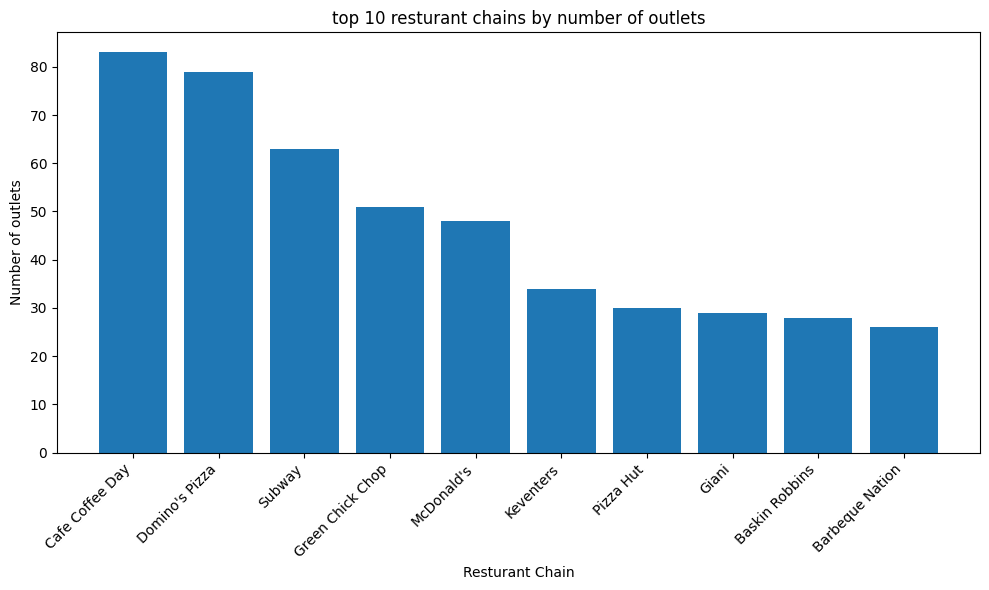

In [24]:
plt.figure(figsize= (10,6))
plt.bar(resturant_chains['Restaurant Name'][:10], resturant_chains['Chain Count'][:10])
plt.xticks(rotation=45,ha='right')
plt.xlabel("Resturant Chain")
plt.ylabel("Number of outlets")
plt.title("top 10 resturant chains by number of outlets")
plt.tight_layout()
plt.show()

# (B) - Analyze the ratings and popularity of different restaurant chains

In [25]:
chain_rating = df.groupby('Restaurant Name')['Aggregate rating'].mean().reset_index(name="Average Rating")
chain_votes= df.groupby('Restaurant Name')['Votes'].sum().reset_index(name="Total Votes")

In [26]:
chain_analysis= pd.merge(chain_rating, chain_votes , on ="Restaurant Name")
chain_analysis= chain_analysis.sort_values(by= "Average Rating", ascending= False)

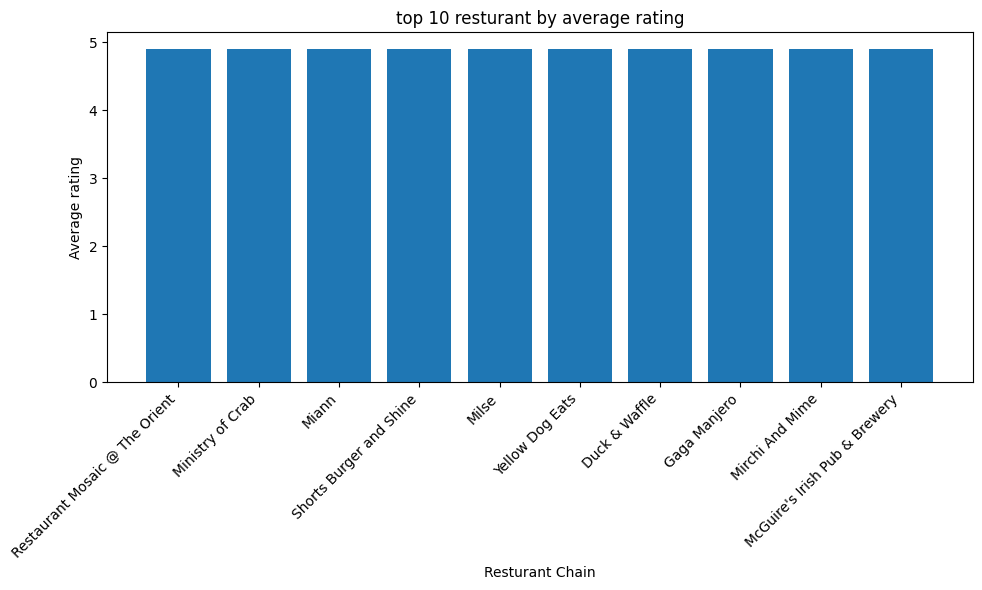

In [27]:
plt.figure(figsize= (10,6))
plt.bar(chain_analysis['Restaurant Name'][:10], chain_analysis['Average Rating'][:10])
plt.xticks(rotation=45,ha='right')
plt.xlabel("Resturant Chain")
plt.ylabel("Average rating")
plt.title("top 10 resturant by average rating")
plt.tight_layout()
plt.show()